# Question-1

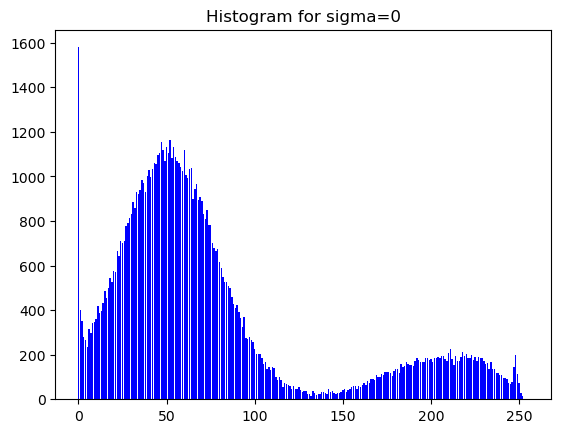

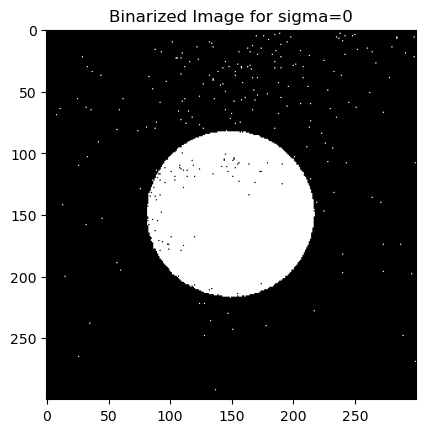

the within class variance for sigma 0 is 705.8781310985962


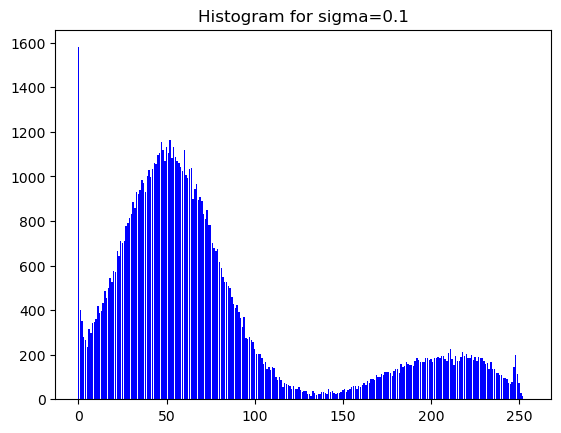

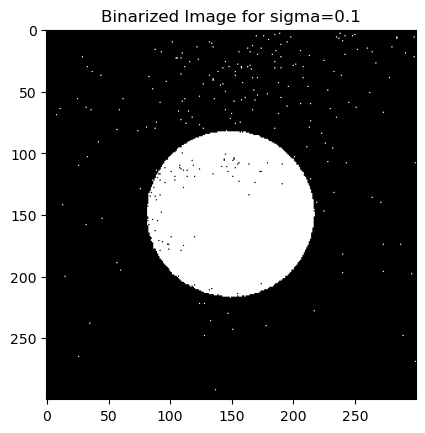

the within class variance for sigma 0.1 is 705.8781310985962


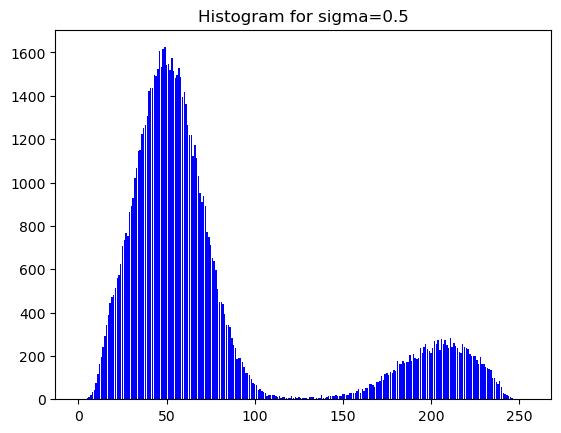

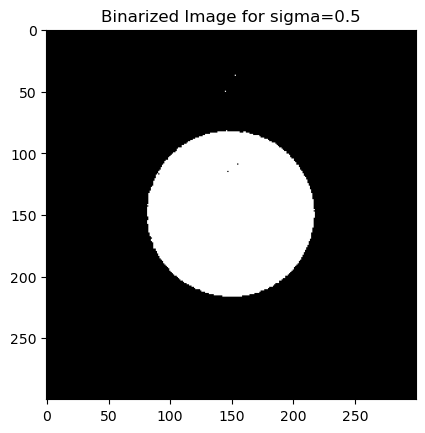

the within class variance for sigma 0.5 is 368.66952130963585


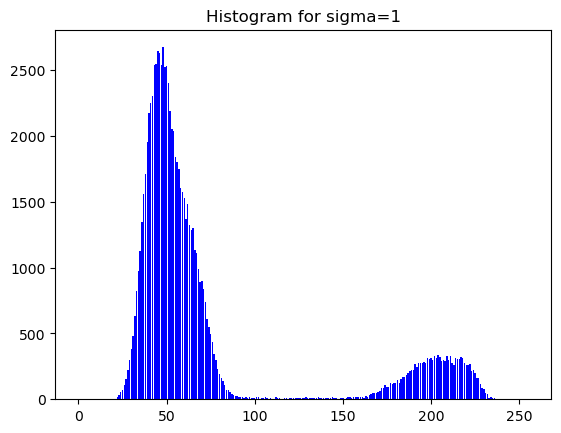

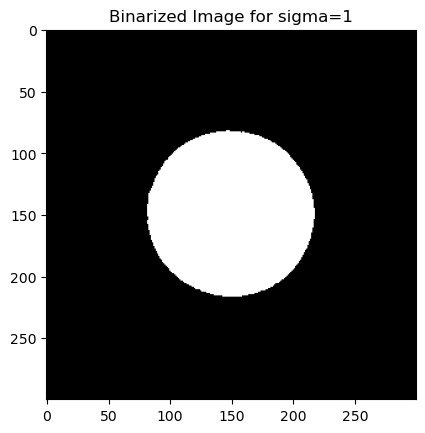

the within class variance for sigma 1 is 181.56220180694106


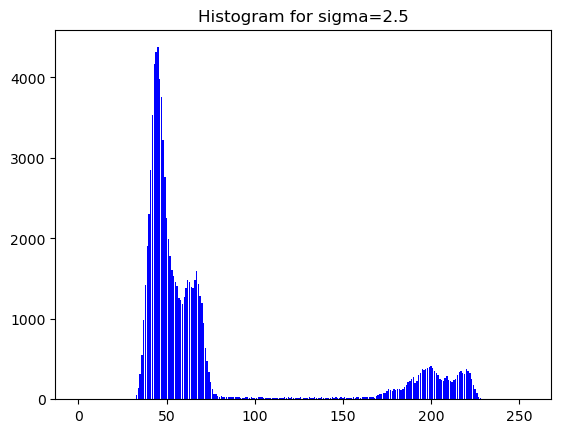

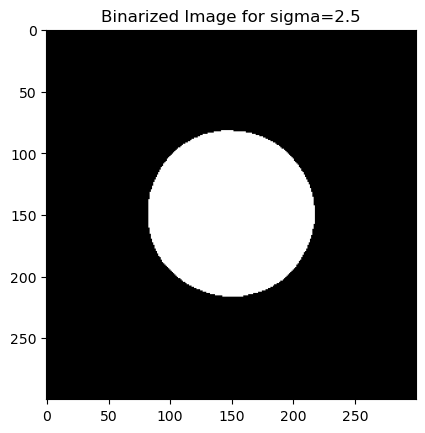

the within class variance for sigma 2.5 is 170.7453490786044


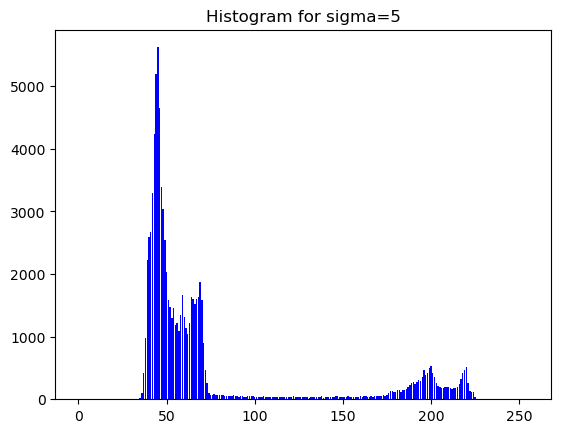

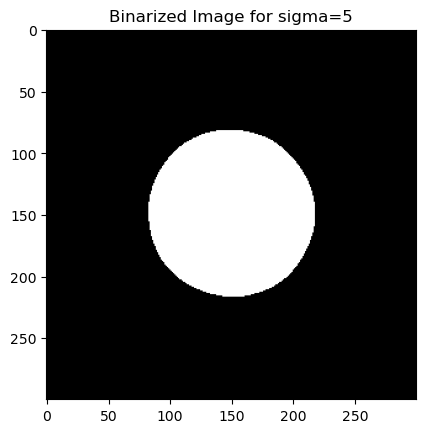

the within class variance for sigma 5 is 211.94966749852912


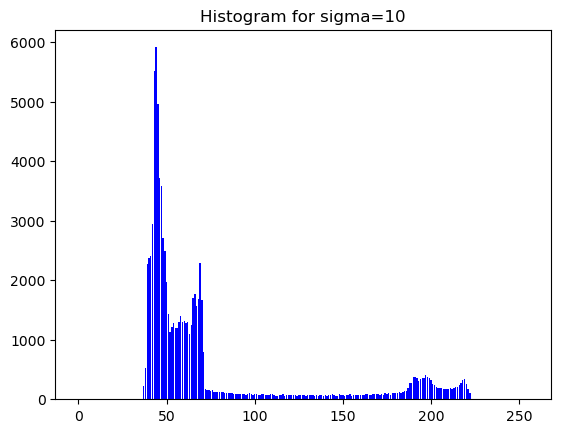

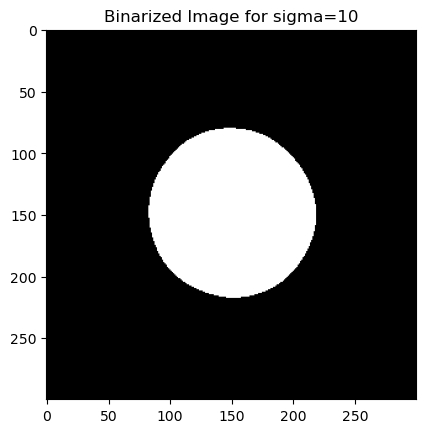

the within class variance for sigma 10 is 278.6786045392623


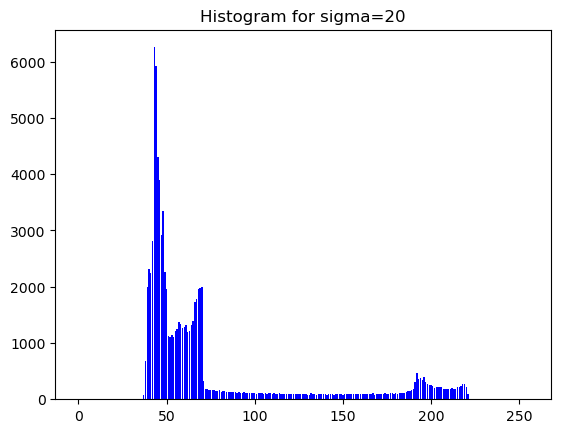

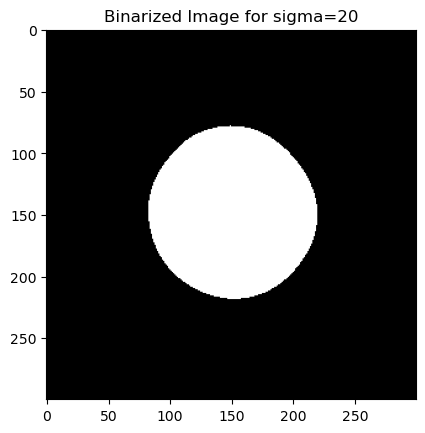

the within class variance for sigma 20 is 319.9827964009445
{0: 705.8781310985962, 0.1: 705.8781310985962, 0.5: 368.66952130963585, 1: 181.56220180694106, 2.5: 170.7453490786044, 5: 211.94966749852912, 10: 278.6786045392623, 20: 319.9827964009445}
We get the min within class variance 170.7453490786044 at sigma 2.5 


In [7]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import convolve

# Function to create a Gaussian kernel
def create_gaussian_kernel(sigma, size=41):
    k = size // 2
    x, y = np.meshgrid(np.arange(-k, k+1), np.arange(-k, k+1))
    kernel = np.exp(-(x**2 + y**2) / (2 * sigma**2))
    kernel /= np.sum(kernel)  # Normalize to make sum of kernel equal to 1
    return kernel

# Apply Gaussian blurring and Otsu's binarization
def apply_gaussian(image, sigma):
    if sigma > 0:
        kernel = create_gaussian_kernel(sigma)
        blurred_image = convolve(image, kernel)
    else:
        blurred_image = image  # No blur when sigma = 0
    return blurred_image

def within_class_variance(grayscale_image,threshold):
    gray_img_array = np.array(grayscale_image)
    
    class_0 = gray_img_array[gray_img_array <= threshold]
    class_1 = gray_img_array[gray_img_array > threshold]
    #if one of the class empty, cant calculte variance and probability
    if len(class_0)==0 or len(class_1)==0:
        return 5000
        
    prob_c_0 = len(class_0)/(len(class_0) + len(class_1))
    prob_c_1 = len(class_1)/(len(class_0) + len(class_1))
    
    c_0_variance = np.var(class_0)
    c_1_variance = np.var(class_1)
    
    sigma_w_square = (prob_c_0)*(c_0_variance)+(prob_c_1)*(c_1_variance)
    return sigma_w_square

def find_thres_minvar(img):
    #finding t by Minimizing the within class variance
    intensities = np.array([i for i in range(256)])
    within_class_variances = np.array([within_class_variance(img,t) for t in intensities])
    threshold_wcv = np.argmin(within_class_variances)
    return min(within_class_variances),threshold_wcv

def histogram(gray_img):
    img_arr = np.asarray(gray_img)
    hist = np.zeros(256)
    for i in range(len(img_arr)):
        for j in range(len(img_arr[0])):
            intensity = img_arr[i,j]
            hist[intensity] += 1
    return hist   

def binarize_img(gray_img, t):
    img_arr = np.array(gray_img)
    img_arr[img_arr<=t] = 0
    img_arr[img_arr>t] = 255
    return img_arr

# Load image
image = cv2.imread('moon_noisy.png', cv2.IMREAD_GRAYSCALE)

# Sigmas to try
sigmas = [0, 0.1, 0.5, 1, 2.5, 5, 10, 20]

  
results = {}


for sigma in sigmas:
    blur_img = apply_gaussian(image, sigma)
    within_class_var, t = find_thres_minvar(blur_img)
    binary_img = binarize_img(blur_img, t)
    #binary_img, within_class_var = apply_gaussian_and_otsu(image, sigma)
    results[sigma] = within_class_var
    # Plot histograms and binarized images
    hist  = histogram(blur_img)
    plt.figure()
    x = [i for i in range(256)]
    plt.bar(x, histogram(blur_img), color='blue')
    plt.title(f"Histogram for sigma={sigma}")
    plt.show()

    plt.imshow(binary_img, cmap='gray')
    plt.title(f"Binarized Image for sigma={sigma}")
    plt.show()
    
    print(f'the within class variance for sigma {sigma} is {within_class_var}')
    
print(results)
min_key, min_value = min(results.items(), key=lambda item: item[1])
print(f'We get the min within class variance {min_value} at sigma {min_key} ')

# Question-2

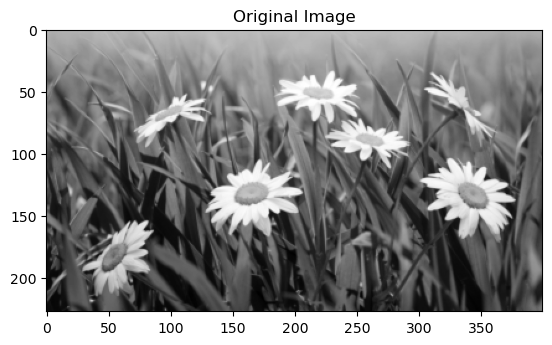

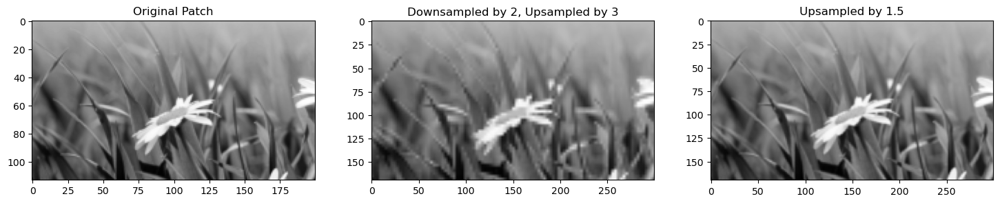

Observations:
1. The 'Downsampled by 2, Upsampled by 3' image shows more artifacts and loss of detail compared to the 'Upsampled by 1.5' image.
2. The 'Upsampled by 1.5' image retains more details and appears smoother.
3. Downsampling followed by upsampling introduces more interpolation artifacts due to the initial loss of information during downsampling.


In [8]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Load the image in grayscale
image = Image.open('flowers.png').convert('L')
image = np.array(image)

plt.imshow(image, cmap='gray')
plt.title('Original Image')


# Custom bilinear interpolation function for grayscale images
def bilinear_interpolation(image, scale_x, scale_y):
    h, w = image.shape
    out_h, out_w = int(h * scale_y), int(w * scale_x)
    out_image = np.zeros((out_h, out_w))
    
    for i in range(out_h):
        for j in range(out_w):
            x = j / scale_x
            y = i / scale_y
            x0 = int(x)
            x1 = min(x0 + 1, w - 1)
            y0 = int(y)
            y1 = min(y0 + 1, h - 1)
            
            a = x - x0
            b = y - y0
            
            out_image[i, j] = (1 - a) * (1 - b) * image[y0, x0] + a * (1 - b) * image[y0, x1] + (1 - a) * b * image[y1, x0] + a * b * image[y1, x1]
    
    return out_image

# Function to downsample the image by a given factor
def downsample(image, factor):
    downsampled = bilinear_interpolation(image, 1/factor, 1/factor)
    return downsampled

# Function to upsample the image by a given factor
def upsample(image, factor):
    upsampled = bilinear_interpolation(image, factor, factor)
    return upsampled

# Downsample by 2
downsampled_image = downsample(image, 2)

# Upsample the downsampled image by 3
down_up_image = upsample(downsampled_image, 3)

# Upsample the original image by 1.5
up_image = upsample(image, 1.5)


def extract_1_4(image):
    h, w = image.shape
    return image[:h//2, :w//2]

# Extract patches
original_patch = extract_1_4(image)
down_up_patch = extract_1_4(down_up_image)
up_patch = extract_1_4(up_image)

# Plot the results
plt.figure(figsize=(18, 8))

plt.subplot(1, 3, 1)
plt.imshow(original_patch, cmap='gray')
plt.title('Original Patch')

plt.subplot(1, 3, 2)
plt.imshow(down_up_patch, cmap='gray')
plt.title('Downsampled by 2, Upsampled by 3')

plt.subplot(1, 3, 3)
plt.imshow(up_patch, cmap='gray')
plt.title('Upsampled by 1.5')

plt.show()

# Comments on observations
print("Observations:")
print("1. The 'Downsampled by 2, Upsampled by 3' image shows more artifacts and loss of detail compared to the 'Upsampled by 1.5' image.")
print("2. The 'Upsampled by 1.5' image retains more details and appears smoother.")
print("3. Downsampling followed by upsampling introduces more interpolation artifacts due to the initial loss of information during downsampling.")

# Question-3

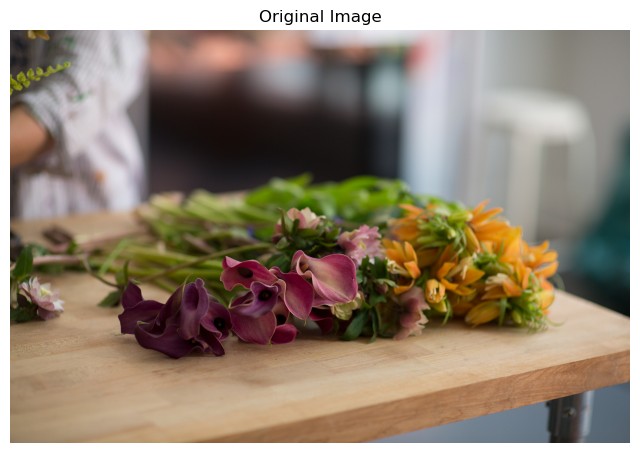

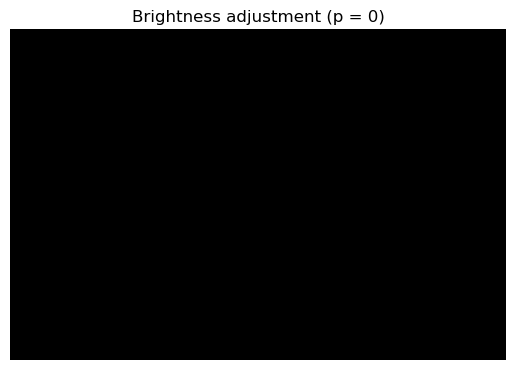

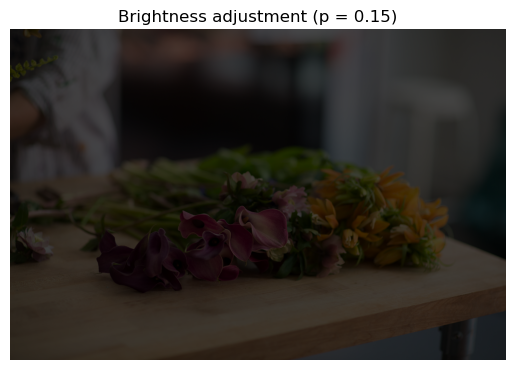

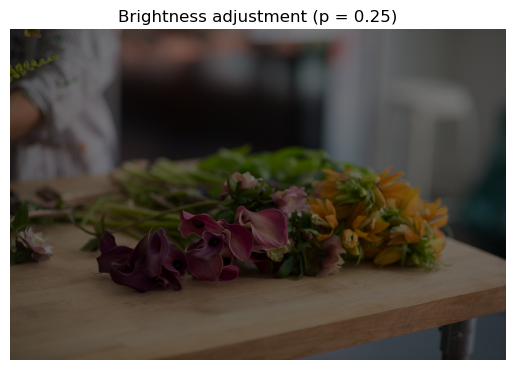

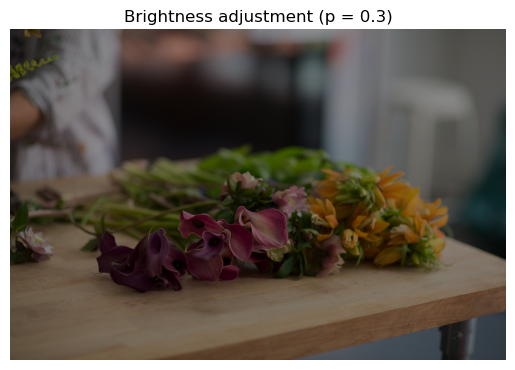

...

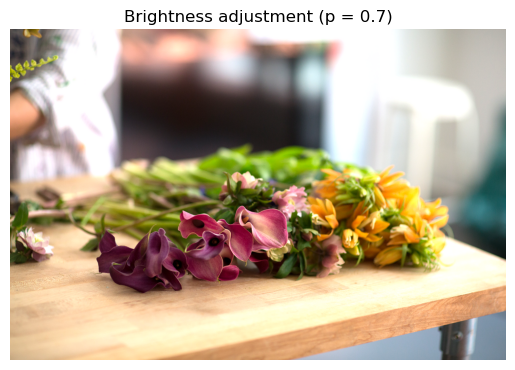

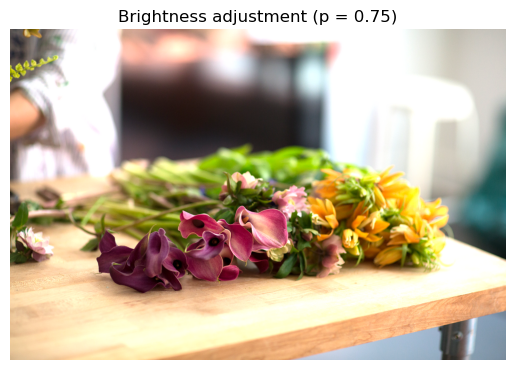

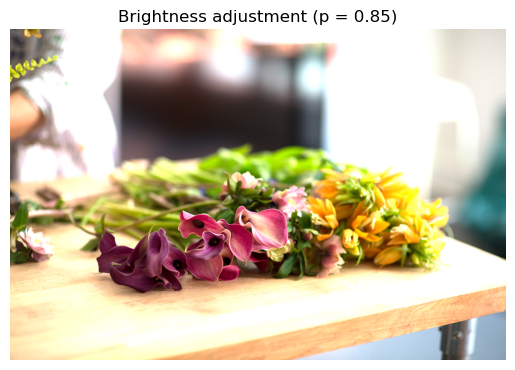

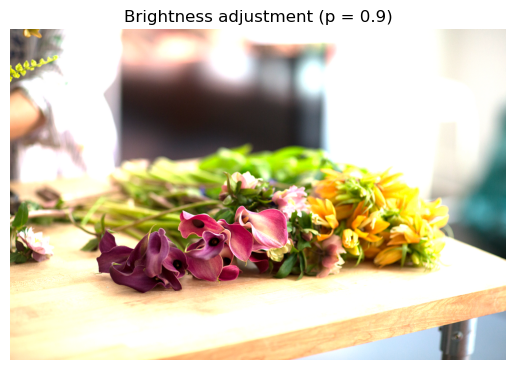

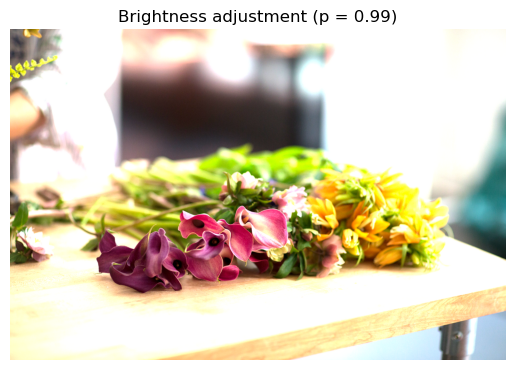

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


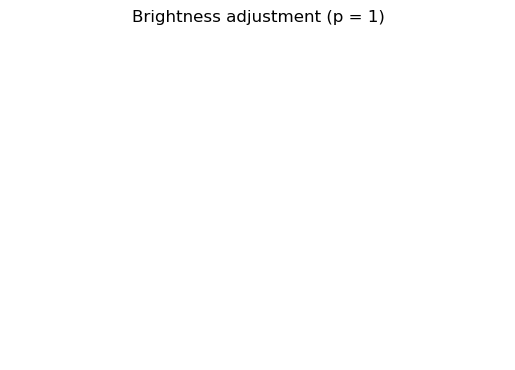

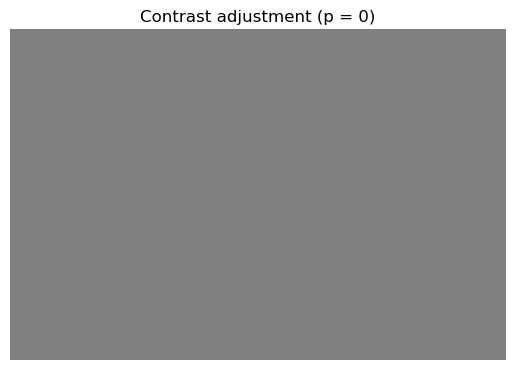

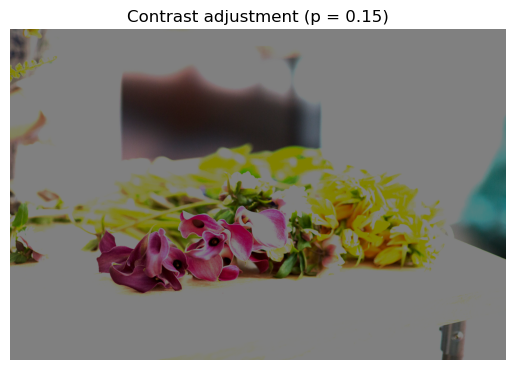

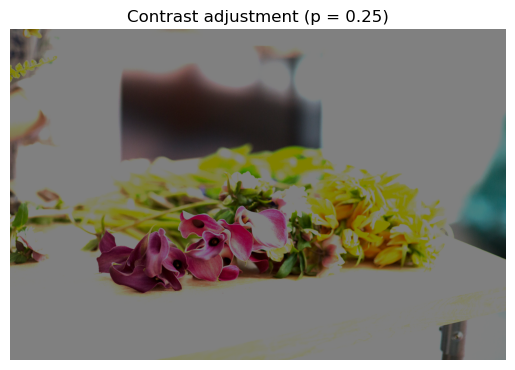

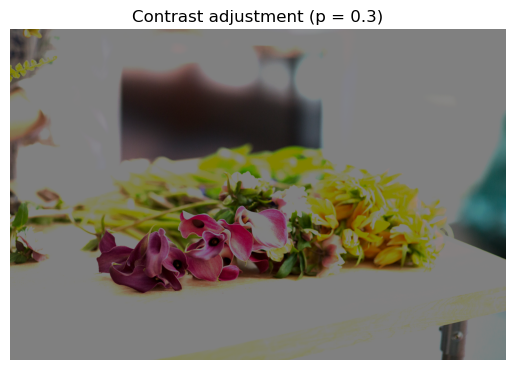

...

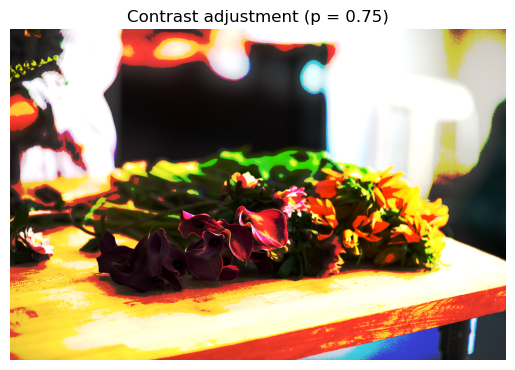

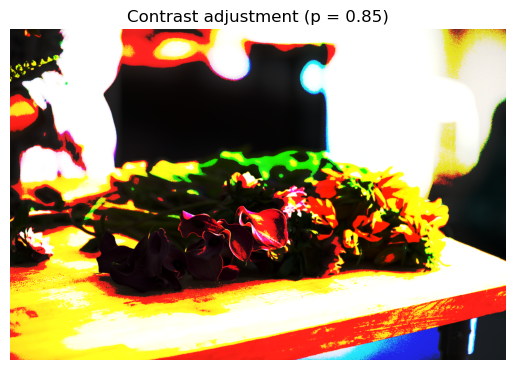

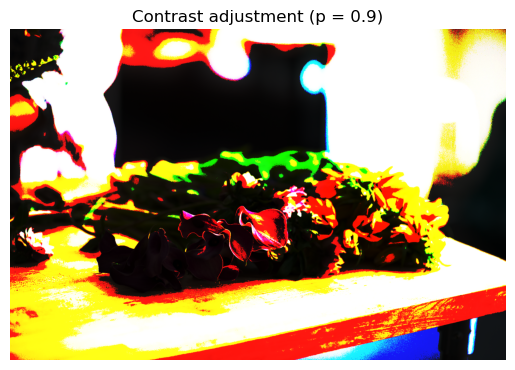

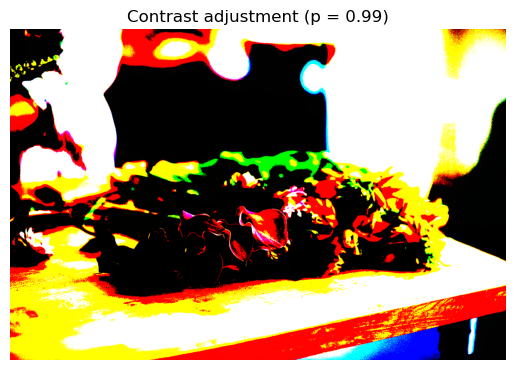

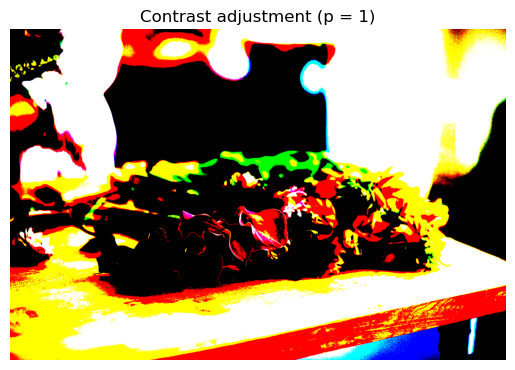

Observations:
1. The 'Brightness p=0.5' image shows the original image without any adjustment.
2. The 'Contrast p=0.5' image shows the original image without any adjustment.
3. Adjusting brightness and contrast affects the overall appearance of the image as expected.


In [9]:
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

def brightnessAdjust(img, p):
    image = np.asarray(img, dtype=np.float32)
    if p < 0 or p > 1:
        raise ValueError("p should be between 0 and 1")
    if p == 0:
        return np.zeros_like(image)  # Return a black image
    elif p == 1:
        return np.ones_like(image) * 255  # Return a white image
    else:
        return np.clip(image * (2 * p), 0, 255).astype(np.uint8)

def clip(value, min_value=0, max_value=255):
    return np.clip(value, min_value, max_value)

def contrastAdjust(image, p):
    # Convert image to a numpy array
    image = np.asarray(image, dtype=np.float32)
    midpoint = 128.0
    
    # If p == 0, set the entire image to the midpoint (gray image)
    if p == 0:
        gray_image = np.full_like(image, midpoint)
        return Image.fromarray(gray_image.astype(np.uint8))
    
    # If p == 1, binarize the image (black or white based on midpoint)
    if p == 1:
        binarized = np.where(image > midpoint, 255, 0)
        return Image.fromarray(binarized.astype(np.uint8))
    
    # For p < 0.5 (decrease contrast)
    if p <= 0.5:
        # Pixel values > midpoint get scaled down (contrast reduced)
        upper_half = np.where(image > midpoint, clip(image * (2 * p), 128, 255), 0)
        # Pixel values < midpoint get scaled up toward midpoint
        lower_half = np.where(image <= midpoint, clip(image * (2 * (1 - p)), 0, 128), 0)
        image = upper_half + lower_half
    
    # For p > 0.5 (increase contrast)
    elif p > 0.5:
        # Pixel values > midpoint get pushed further away (contrast increased)
        upper_half = np.where(image > midpoint, clip(image * (2 * p), 128, 255), 0)
        # Pixel values < midpoint get pulled closer to 0
        lower_half = np.where(image <= midpoint, clip(image * (2 * (1 - p)), 0, 128), 0)
        image = upper_half + lower_half
    
    # Convert back to uint8 type and return as an image
    contrast_image = Image.fromarray(image.astype(np.uint8))
    return contrast_image


# Load the image (replace with the actual image path)
image_path = "brightness_contrast.jpg"
image = Image.open(image_path)




plt.figure(figsize=(8, 8))
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')
plt.show()



brightness_p_values = [0, 0.15, 0.25, 0.3, 0.45, 0.5, 0.55, 0.7, 0.75, 0.85, 0.9, 0.99, 1]

for brightness_p in brightness_p_values:
    bright_image = brightnessAdjust(image, brightness_p)
    plt.imshow(bright_image, cmap='gray')
    plt.title('Brightness adjustment (p = ' + str(brightness_p) + ')')
    plt.axis('off')
    plt.show()

# Contrast adjustments
contrast_p_values = [0, 0.15, 0.25, 0.3, 0.45, 0.5, 0.55, 0.7, 0.75, 0.85, 0.9, 0.99, 1]
for contrast_p in contrast_p_values:
    contrast_image = contrastAdjust(image, contrast_p)
    plt.imshow(contrast_image, cmap='gray')
    plt.title('Contrast adjustment (p = ' + str(contrast_p) + ')')
    plt.axis('off')
    plt.show()

# Comments on observations
print("Observations:")
print("1. The 'Brightness p=0.5' image shows the original image without any adjustment.")
print("2. The 'Contrast p=0.5' image shows the original image without any adjustment.")
print("3. Adjusting brightness and contrast affects the overall appearance of the image as expected.")

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


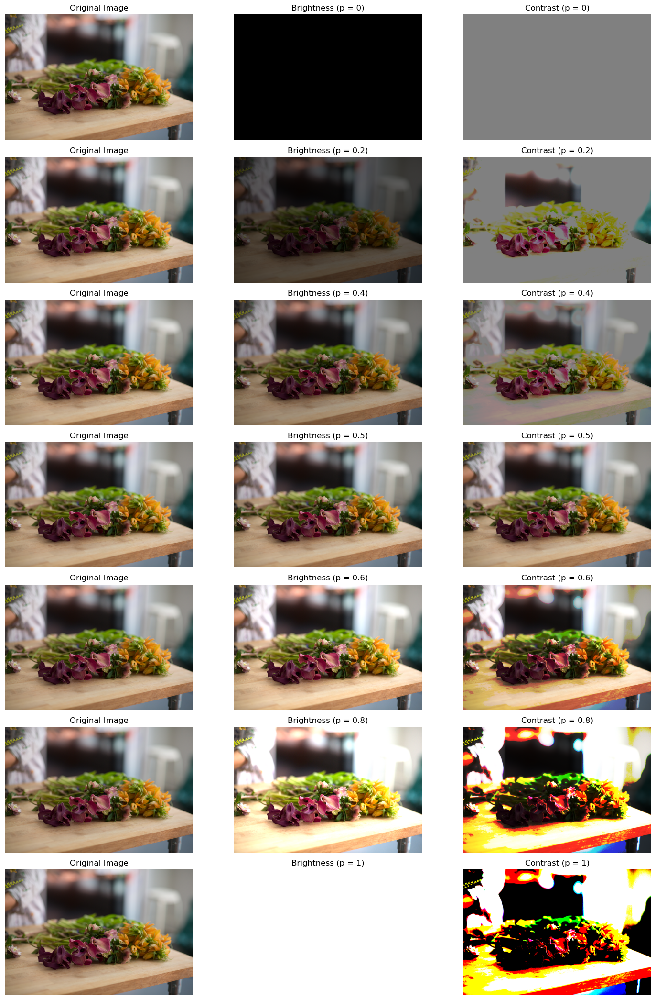

In [10]:
# Specify the p values
p_values = [0, 0.2, 0.4, 0.5, 0.6, 0.8, 1]

# Create a figure with 7 rows and 3 columns
fig, axes = plt.subplots(nrows=len(p_values), ncols=3, figsize=(15, 21))

for i, brightness_p in enumerate(p_values):
    # Original image
    axes[i, 0].imshow(image)
    axes[i, 0].set_title('Original Image')
    axes[i, 0].axis('off')

    # Brightness adjusted image
    bright_image = brightnessAdjust(image, brightness_p)
    axes[i, 1].imshow(bright_image)
    axes[i, 1].set_title('Brightness (p = ' + str(brightness_p) + ')')
    axes[i, 1].axis('off')

    # Contrast adjusted image
    contrast_image = contrastAdjust(image, brightness_p)  # Using brightness_p for contrast as well
    axes[i, 2].imshow(contrast_image)
    axes[i, 2].set_title('Contrast (p = ' + str(brightness_p) + ')')
    axes[i, 2].axis('off')

plt.tight_layout()
plt.show()